## MouseBrain

In [8]:
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns
import anndata as ad
import torch
from sklearn.utils import shuffle
from scipy.stats import pearsonr
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import rcParams
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size":22,
    "axes.unicode_minus": False #解决负号无法显示的问题
}
rcParams.update(config)

/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: 

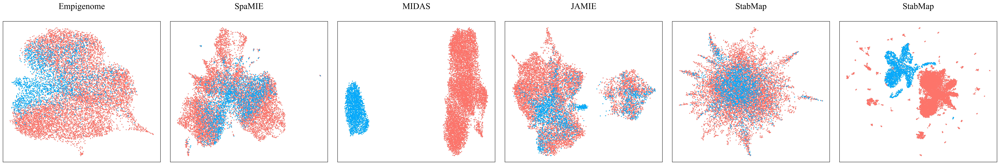

In [9]:
def plot_batch_umap(adata, rep_key, ax, title):
    """为给定的嵌入表示绘制批次UMAP图"""
    # 创建包含指定嵌入的AnnData对象
    adata_rep = ad.AnnData(X=adata.obsm[rep_key])
    adata_rep.obs['batch'] = str(1)
    adata_rep.obs['batch'][:9692] = str(1)
    adata_rep.obs['batch'][9692:] = str(2)
    
    # 设置自定义颜色
    adata_rep.uns['batch_colors'] = ['#FC746A', '#05A9FC']  # 红/蓝配色
    
    # 计算UMAP
    sc.pp.neighbors(adata_rep, use_rep='X', n_neighbors=10)
    sc.tl.umap(adata_rep)
    
    # 绘图
    sc.pl.umap(adata_rep, color='batch', ax=ax, s=20, title=title, show=False)
    ax.get_legend().remove()
    ax.set_xlabel('')
    ax.set_ylabel('')
    return adata_rep

from SpatialGlue.preprocess import clr_normalize_each_cell, pca
path = '/data/xiangdw/data/data/MouseBrain_new/'
adata = sc.read_h5ad(path + 'MouseBrain_H3K27me3_concat.h5ad')
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=3000)
adata_high =  adata[:, adata.var['highly_variable']]
adata.obsm['PCA'] = pca(adata_high, n_comps=64)

methods = [
    ('PCA', 'PCA'),
    ('SpaMIE_pred_1', 'SpaMIE'),
    ('MIDAS_pred_1', 'MIDAS'),
    ('JAMIE_pred_1', 'JAMIE'),
    ('StabMap_pred_1', 'StabMap'),
    ('MEFISTO_pred_1', 'MEFISTO'),
]
path = '/data/xiangdw/data/data/MouseBrain_new/'
adata1 = sc.read_h5ad(path + 'MouseBrain_concat_methods.h5ad')
adata1.obsm['PCA'] = adata.obsm['PCA']
fig = plt.figure(figsize=(34, 6),dpi=400)
gs = GridSpec(1, 6, figure=fig)
titles = ['Empigenome', 'SpaMIE',  'MIDAS', 'JAMIE', 'StabMap','StabMap'] # 'SpaMultiVAE', 'MEFISTO', 'MISO'
for i, (rep_key, _) in enumerate(methods):
    ax = fig.add_subplot(gs[0, i])
    _ = plot_batch_umap(adata1, rep_key, ax, "")

    ax.set_title(titles[i], fontsize=21, pad=30) 
plt.tight_layout()
plt.show()

/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 

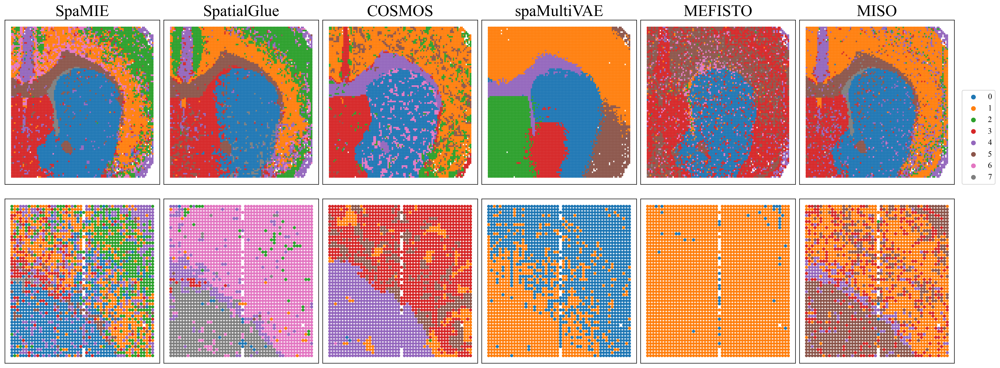

In [ ]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

path = '/data/xiangdw/data/data/MouseBrain_new/'
adata = sc.read_h5ad(path + "MouseBrain_concat_methods.h5ad")
adata.obsm['spatial'] = adata.obs[['row', 'col']].values

adata.obs['SpatialGlue_pred_1'] = (adata.obs['SpatialGlue_pred_1'].astype(int)).astype('category')
SpatialGlue = np.array(adata.obs['SpatialGlue_pred_1'], dtype=int).tolist()
swap_dict = {0:0, 1: 3, 2: 6, 3: 1, 4: 2, 5: 4, 6:5, 7: 7}
SpatialGlue = [swap_dict[category] for category in SpatialGlue]
adata.obs['SpatialGlue_pred_1'] = pd.Categorical(SpatialGlue)

adata.obs['COSMOS_pred_1'] = (adata.obs['COSMOS_pred_1'].astype(int)).astype('category')
COSMOS = np.array(adata.obs['COSMOS_pred_1'], dtype=int).tolist()
swap_dict = {0:1, 1: 0, 2: 6, 3: 3, 4: 4, 5: 5, 6: 2, 7: 7}
COSMOS = [swap_dict[category] for category in COSMOS]
adata.obs['COSMOS_pred_1'] = pd.Categorical(COSMOS)
COSMOS = np.array(adata.obs['COSMOS_pred_1'], dtype=int).tolist()
swap_dict = {0:0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 6, 6: 5, 7: 7}
COSMOS = [swap_dict[category] for category in COSMOS]
adata.obs['COSMOS_pred_1'] = pd.Categorical(COSMOS)


adata.obs['SpaVAE_64_pred_1'] = (adata.obs['SpaVAE_64_pred_1'].astype(int)).astype('category')
spaMutiVAE = np.array(adata.obs['SpaVAE_64_pred_1'], dtype=int).tolist()
swap_dict = {0:1, 1: 0, 2: 3, 3: 2, 4: 6, 5: 7, 6: 4, 7: 5}
spaMutiVAE = [swap_dict[category] for category in spaMutiVAE]
adata.obs['SpaVAE_64_pred_1'] = pd.Categorical(spaMutiVAE)

adata.obs['MISO_pred_1'] = (adata.obs['MISO_pred_1'].astype(int)).astype('category')
MISO = np.array(adata.obs['MISO_pred_1'], dtype=int).tolist()
swap_dict = {0:1,1:0 , 2: 4, 3: 2, 4: 5, 5: 3, 6: 6, 7: 7}
MISO= [swap_dict[category] for category in MISO]
adata.obs['MISO_pred_1'] = pd.Categorical(MISO)


adata1 = adata[adata.obs['batch'] == '1'].copy()
adata2 = adata[adata.obs['batch'] == '2'].copy()

methods = ['SpaMIE', 'SpatialGlue', 'COSMOS', 'SpaVAE_64', 'MEFISTO', 'MISO']
color_cols = [f'{m}_pred_1' for m in methods]
titles = ['SpaMIE', 'SpatialGlue', 'COSMOS', 'spaMultiVAE', 'MEFISTO', 'MISO']

fig, axs = plt.subplots(2, 6, figsize=(21, 8), dpi=300)
plt.rcParams['font.size'] = 20

for i, (color, title) in enumerate(zip(color_cols, titles)):
    sc.pl.embedding(adata1, basis='spatial', color=[color], 
                   ax=axs[0, i], title=title, s=30, show=False)
    
for i, color in enumerate(color_cols):
    sc.pl.embedding(adata2, basis='spatial', color=[color], 
                   ax=axs[1, i], title='', s=80, show=False)

for ax_row in axs:
    for ax in ax_row:
        ax.invert_xaxis()
        ax.invert_yaxis()
        ax.set_xlabel('')
        ax.set_ylabel('')
        
        if ax != axs[0, 5]:
            leg = ax.get_legend()
            if leg: leg.remove()


if axs[0, 5].get_legend():
    axs[0, 5].legend(bbox_to_anchor=(1.05, 0), loc=3, 
                     borderaxespad=0, fontsize=12)

plt.tight_layout(w_pad=0.3)
plt.show()
